# $\mathrm{O_3}$

In [1]:
using Plots, MLPlotRecipes
using HDF5
using Tables, DataFrames, CSV
using MLJ, MLJGaussianProcesses
using StatsBase 

In [2]:
include("./utils.jl")

data_to_df

In [3]:
h5_path = "../../data/photolysis_data.h5" 
species = "O3" 

λs, σs, T1s, T2s, source_idx, T_units, category, formula, λ_units, σ_units = get_raw_data(h5_path, species)

# min_data_λ = minimum(λs)
# max_data_λ = maximum(λs)

println(min_data_λ)
println(max_data_λ)

52.6
1100.0


In [4]:
# load in spectrometer wavelengths
hr4000_df = CSV.File("../hr4000_wavelengths.txt") |> DataFrame ; 


In [5]:
println(nrow(hr4000_df))
println(maximum(hr4000_df.λ))
println(minimum(hr4000_df.λ))

3648
1120.216
194.249


In [6]:
Δλ = 50 # nm for padding
df = data_to_df(λs, σs, T1s, T2s, source_idx; λ_lb=minimum(hr4000_df.λ)-Δλ, λ_ub=maximum(hr4000_df.λ)+Δλ)
println(nrow(df))
describe(df)

366284


Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Real,Float64,Real,Int64,DataType
1,λ,565.311,144.91,539.96,1100.0,0,Float64
2,σ,9.07613e-19,3.4377e-25,8.0905e-22,1.41e-17,0,Float64
3,T,293.791,290.0,293.0,300.0,0,Float64
4,source_id,130.284,1,175.0,249,0,Int64


In [7]:
nskip = 5

p2 = scatter(
    df.λ[1:nskip:end],
    log10.(df.σ[1:nskip:end]),
    zcolor=df.T[1:nskip:end],
    ms=3, 
    msw=0,
    xlabel="λ [$(λ_units)]",
    ylabel="log10(σ) [cm²]",
    alpha=0.7,
    rightmargin=10Plots.mm,
    colorbar_title="T [$(T_units)]",
    title="Absorption Cross Section for O₃",
    label="",
)

savefig("O3_p2.png")

display(p2)

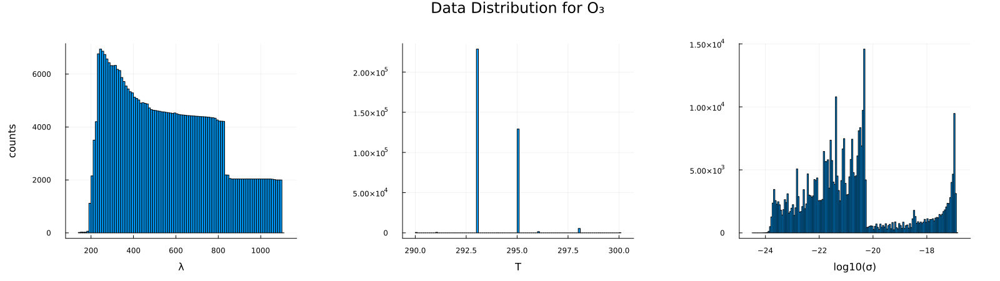

In [8]:
p1 = histogram(df.λ, xlabel="λ", ylabel="counts", label="", margin=10Plots.mm)
p2 = histogram(df.T, xlabel="T", label="", margin=10Plots.mm)
p3 = histogram(log10.(df.σ), xlabel="log10(σ)", label="", margin=10Plots.mm)
#p3 = histogram(df.σ, xlabel="σ", ylabel="counts")

phist = plot(p1, p2, p3, layout=(1,3), size=(1600, 450), plot_title="Data Distribution for O₃")

In [9]:
# load in spectrometer wavelengths
hr4000_df = CSV.File("../hr4000_wavelengths.txt") |> DataFrame ; 

In [10]:
println(nrow(hr4000_df))
println(maximum(hr4000_df.λ))
println(minimum(hr4000_df.λ))

3648
1120.216
194.249


It appears that GPR can not handle identical records with different target values, i.e. if $x\_1 = [1.0, 2.0]$ and $x\_2 = [1.0, 2.0]$, while $y\_1 = 7.2$ and $y_2 = 7.89$. To deal with this, let's first group the dataframe by temperature, and average across identical wavelength values. 

In [11]:
gdfs = groupby(df, :T)

res_dfs = []

for gdf ∈ gdfs
    gdf_by_λ = groupby(gdf, :λ)
    push!(res_dfs, combine(gdf_by_λ, [:σ, :T] .=> mean, renamecols = false))
end

df_unique = vcat(res_dfs...)

Row,λ,σ,T
,Float64,Float64,Float64
1,145.95,5.23e-18,298.0
2,148.1,4.47e-18,298.0
3,150.35,3.69e-18,298.0
4,152.65,2.93e-18,298.0
5,155.0,2.19e-18,298.0
6,157.45,1.63e-18,298.0
7,160.0,1.2e-18,298.0
8,162.6,9.77e-19,298.0
9,165.3,8.66e-19,298.0


In [34]:
function representative_rand_sample(column::AbstractVector, nbins::Int, npoints::Int)
    n_per_bin = floor(Int, npoints/nbins)
    hist = fit(Histogram, column, nbins=nbins)
    bin_edges = hist.edges[1]
    
    idx_out = []
    
    # loop over each bin
    for i ∈ 1:size(bin_edges, 1)-1
        bin_idxs = findall(ξ -> bin_edges[i] < ξ && ξ < bin_edges[i+1], column)
        n_to_sample = minimum([n_per_bin, size(bin_idxs, 1)])
        idx_res = sample(bin_idxs, n_to_sample, replace=false)
        push!(idx_out, idx_res)  # sample without replacement
    end

    return unique(vcat(idx_out...))
end

λ_idxs = representative_rand_sample(df_unique.λ, 1000, 1500)
σ_idxs = representative_rand_sample(log10.(df_unique.σ), 500, 2000) 



idxs_res = shuffle(unique(vcat(λ_idxs, σ_idxs)))


df_sampled = df_unique[idxs_res, :]


max_data_λ = maximum(df_sampled.λ)
min_data_λ = minimum(df_sampled.λ)

144.91

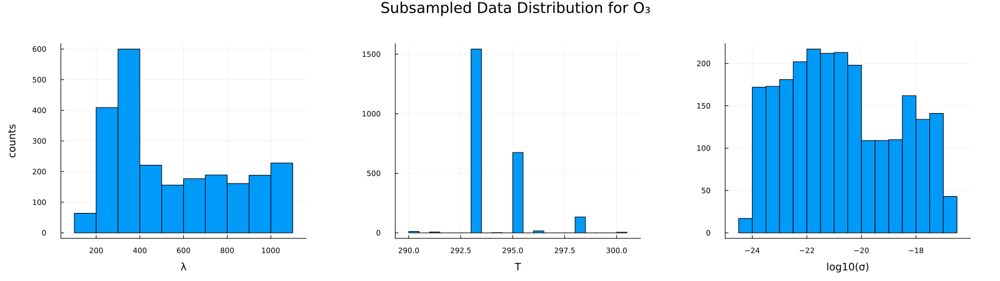

In [24]:
p1 = histogram(df_sampled.λ, xlabel="λ", ylabel="counts", label="", margin=10Plots.mm)
p2 = histogram(df_sampled.T, xlabel="T", label="", margin=10Plots.mm)
p3 = histogram(log10.(df_sampled.σ), xlabel="log10(σ)", label="", margin=10Plots.mm)
#p3 = histogram(df.σ, xlabel="σ", ylabel="counts")

phist = plot(p1, p2, p3, layout=(1,3), size=(1600, 450), plot_title="Subsampled Data Distribution for O₃")

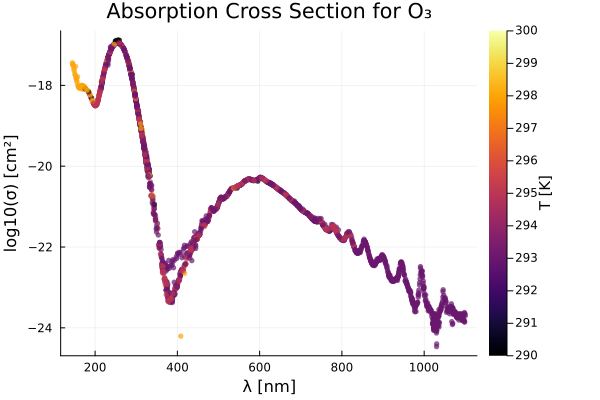

In [25]:
p = scatter(
    df_sampled.λ,
    log10.(df_sampled.σ),
    zcolor=df_sampled.T,
    ms=3, 
    msw=0,
    xlabel="λ [$(λ_units)]",
    ylabel="log10(σ) [cm²]",
    alpha=0.7,
    rightmargin=10Plots.mm,
    colorbar_title="T [$(T_units)]",
    title="Absorption Cross Section for O₃",
    label="",
)

In [26]:
using KernelFunctions
using ParameterHandling

#kernel(θ) = θ.σ₁²*(SqExponentialKernel() ∘ ScaleTransform(1/(2(θ.ℓ₁)^2))) + θ.σ₂²*(Matern32Kernel() ∘ ScaleTransform(1/(2(θ.ℓ₂)^2)))
#θ_init = (;σ₁²=positive(0.1), ℓ₁=positive(0.1), σ₂²=positive(0.1), ℓ₂=positive(0.1),)
# gpr = GPR(
    # k = kernel,
    # θ_init = θ_init, 
    # σ²=1e-5
# )
# mach = machine(gpr, Xtrain, ytrain) |> fit!
ntrain = 2000
println(nrow(df_sampled))
Xtrain = df_sampled[1:ntrain, [:λ, :T]]
Xtest = df_sampled[ntrain+1:end, [:λ, :T]]

ytrain = log10.(df_sampled.σ[1:ntrain])
ytest = log10.(df_sampled.σ[ntrain+1:end])

#gpr = GPR(σ²=0.00001)
gpr = GPR(σ²=20.0)
#gpr = GPR(σ²=10.0)

mach = machine(gpr, Xtrain, ytrain) |> fit!

2393


[ Info: Training machine(GPR(μ = 0.0, …), …).


Iter     Function value   Gradient norm 
     0     1.895553e+04     1.089245e+04
 * time: 0.00023293495178222656
     1     1.406705e+04     9.992374e+02
 * time: 6.140300035476685
     2     4.567351e+03     6.056796e+02
 * time: 10.95110297203064
     3     4.469610e+03     8.338185e+02
 * time: 12.765144109725952
     4     4.245273e+03     7.726211e+01
 * time: 14.0292489528656
     5     4.242124e+03     2.229819e+00
 * time: 15.859333038330078
     6     4.242119e+03     1.307826e+00
 * time: 17.749542951583862
     7     4.241513e+03     1.770765e+00
 * time: 22.196347951889038
     8     4.241457e+03     1.281473e+00
 * time: 24.05824589729309
     9     4.241454e+03     3.385108e-01
 * time: 25.327658891677856
    10     4.241453e+03     1.620705e-03
 * time: 26.470855951309204
    11     4.241453e+03     3.661842e-06
 * time: 27.685795068740845
    12     4.241453e+03     3.625067e-08
 * time: 28.96527409553528
    13     4.241453e+03     3.625067e-08
 * time: 30.11615300178

trained Machine; caches model-specific representations of data
  model: GPR(μ = 0.0, …)
  args: 
    1:	Source @834 ⏎ Table{AbstractVector{Continuous}}
    2:	Source @707 ⏎ AbstractVector{Continuous}


In [27]:
y_pred_train = predict_mean(mach, Xtrain);
y_pred_test = predict_mean(mach, Xtest);

now let's collect some more points in order to evaluate our model using indices other than the ones used during training. 


┌ Warning: Keyword argument `orientation` is deprecated.
│ Please use `permute` instead.
└ @ Plots ~/.julia/packages/Plots/QZRtR/src/args.jl:1548


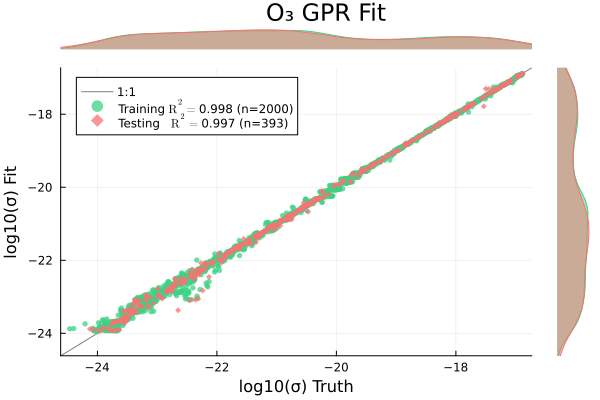

In [28]:
p = scatterresult(
    ytrain, y_pred_train,
    ytest, y_pred_test,
    xlabel="log10(σ) Truth",
    ylabel="log10(σ) Fit",
    plot_title="O₃ GPR Fit"
)

savefig("O3_scatter.png")
savefig("O3_scatter.pdf")

display(p)

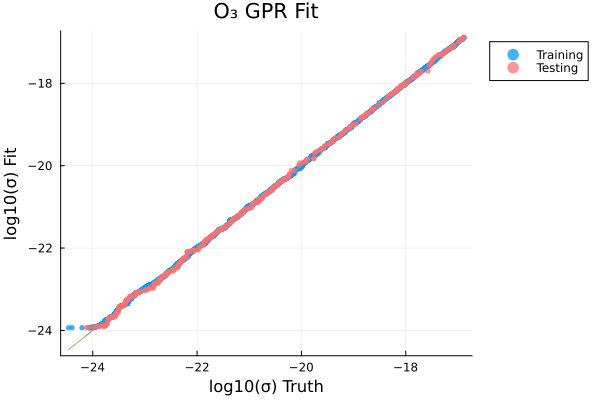

In [29]:
p = quantilequantile(
    ytrain, y_pred_train,
    ytest, y_pred_test,
    xlabel="log10(σ) Truth",
    ylabel="log10(σ) Fit",
    title="O₃ GPR Fit"
)

savefig("O3_quantile.png")
savefig("O3_quantile.pdf")

display(p)

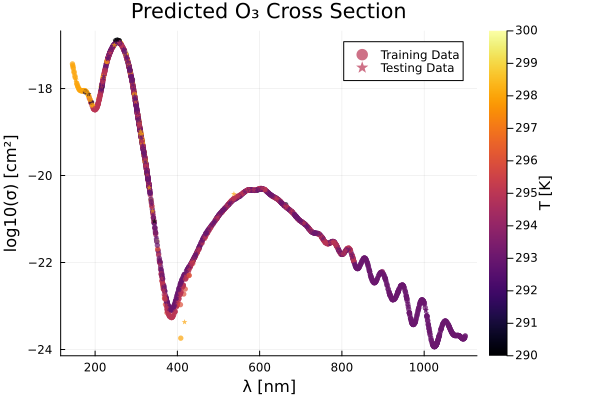

In [30]:
p1 = scatter(
    Xtrain.λ,
    y_pred_train,
    zcolor=Xtrain.T,
    ms=3, 
    msw=0,
    xlabel="λ [$(λ_units)]",
    ylabel="log10(σ) [cm²]",
    alpha=0.7,
    rightmargin=10Plots.mm,
    colorbar_title="T [$(T_units)]",
    label="Training Data",
)

scatter!(
    Xtest.λ,
    y_pred_test,
    zcolor=Xtest.T,
    ms=3, 
    msw=0,
    # markershape=:rect,
    markershape=:star5,
    xlabel="λ [$(λ_units)]",
    ylabel="log10(σ) [cm²]",
    alpha=0.7,
    rightmargin=10Plots.mm,
    colorbar_title="T [$(T_units)]",
    title="Predicted O₃ Cross Section",
    label="Testing Data",
)

savefig("predicted_O3_data.png")
savefig("predicted_O3_data.pdf")

display(p1)

Finally, let's try prediction at the desired wavelength bins: 

194.249
1099.64


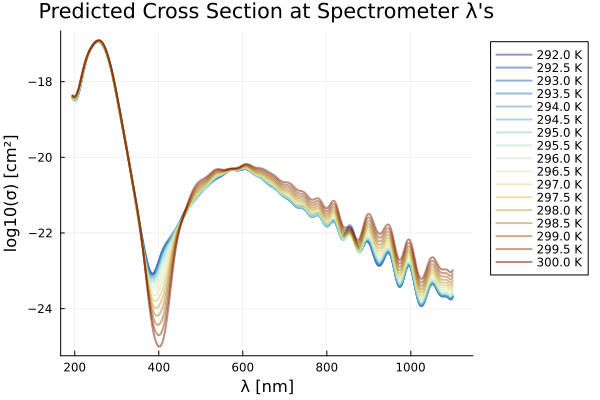

In [56]:
λ_min = maximum([min_data_λ, minimum(hr4000_df.λ)])
λ_max = minimum([max_data_λ, maximum(hr4000_df.λ)])

println(λ_min)
println(λ_max)

function predict_logσ(T, λs, mach, λ_bounds)
    λ_lb, λ_ub = λ_bounds
    
    Xout = copy(λs)
    Tout = T
    Xout[!, :T] = [Tout for _ ∈ 1:nrow(λs)]
    res = predict_mean(mach, Xout)
    
    idxs = [idx for idx ∈ 1:nrow(Xout) if (Xout.λ[idx] ≤ λ_lb) || (λ_ub ≤ Xout.λ[idx])]
    res[idxs] .= NaN 
    return res
end



p = plot()

Ts = 292.0:0.5:300.0
# cs = cgrad(:thermal, Ts, categorical = true)
cs = cgrad(:roma, size(Ts,1), categorical = true, rev=true)
i = 1
for T ∈ Ts
    logσ = predict_logσ(T, hr4000_df, mach, (λ_min, λ_max))
    plot!(
        hr4000_df.λ, logσ,
        linewidth=2,
        alpha=0.5,
        color=cs[i],
        label="$(T) K",
        legend=:outertopright,
    )
    i+=1
end

xlabel!("λ [nm]")
ylabel!("log10(σ) [cm²]")
title!("Predicted Cross Section at Spectrometer λ's")
savefig("O3_σ_vs_T.png")
savefig("O3_σ_vs_T.pdf")

display(p)

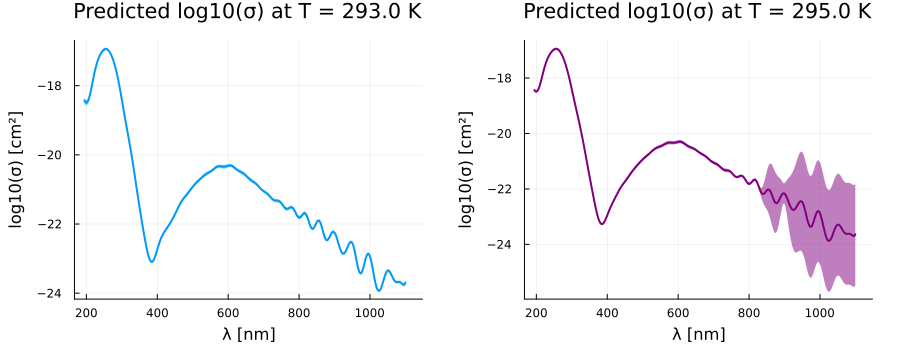

In [86]:
function predict_logσ_wΔ(T, λs, mach, λ_bounds)
    λ_lb, λ_ub = λ_bounds
    
    Xout = copy(λs)
    Tout = T
    Xout[!, :T] = [Tout for _ ∈ 1:nrow(λs)]
    res = MLJ.predict(mach, Xout)

    logσ = mean.(res)
    Δlogσ = std.(res)

    idxs = [idx for idx ∈ 1:nrow(Xout) if (Xout.λ[idx] ≤ λ_lb) || (λ_ub ≤ Xout.λ[idx])]
    logσ[idxs] .= NaN 
    Δlogσ[idxs] .= NaN 
    return logσ, Δlogσ
    #return res
end

Tplot = 293.0
logσ, Δlogσ = predict_logσ_wΔ(Tplot, hr4000_df, mach, (λ_min, λ_max))

p1 = plot(
    hr4000_df.λ, logσ,
    ribbon= 2 .* Δlogσ,
    fillalpha=0.5,
    linewidth=2,
    xlabel="λ [nm]",
    ylabel="log10(σ) [cm²]",
    title="Predicted log10(σ) at T = $(Tplot) K",
    label="",
)

Tplot = 295.0
logσ, Δlogσ = predict_logσ_wΔ(Tplot, hr4000_df, mach, (λ_min, λ_max))

p2 = plot(
    hr4000_df.λ, logσ,
    ribbon= 2 .* Δlogσ,
    fillalpha=0.5,
    linewidth=2,
    color=:purple,
    xlabel="λ [nm]",
    ylabel="log10(σ) [cm²]",
    title="Predicted log10(σ) at T = $(Tplot) K",
    label=""
)

plot(p1, p2, layout=(1,2), margin=5Plots.mm, size=(900,350)) 